In [1]:
# Network Data Science 
import networkx as nx

# Data Wrangling
import numpy as np
import pandas as pd
import pickle

# Network Data Analysis 
import networkx as nx
import netwulf as nw
import geonetworkx as gnx

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt 
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patheffects as path_effects
from mpl_toolkits.mplot3d.art3d import Line3DCollection
%pylab inline

# Geo-Spatial Data Analysis
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Other Utilities
from operator import itemgetter
from collections import defaultdict

# Custom Modules
import digital_epidemiology as depi

# Reload Custom Modules
from importlib import reload
depi = reload(depi)

Populating the interactive namespace from numpy and matplotlib


## Data Collection 

In [51]:
# Set geodata file path
regions = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/Shape/Reg01012020/Reg01012020_WGS84.shp"
provinces = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/Shape/ProvCM01012020/ProvCM01012020_WGS84.shp"
macro_regions = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/Shape/RipGeo01012020/RipGeo01012020_WGS84.shp"
municipalities = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/Shape/Com01012020/Com01012020_WGS84.shp"

# Set demodata file path
regional_demographics = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/CSV/RegionalDemographics.csv"
provincial_demographics = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/CSV/ProvincialDemographics.csv"
municipal_demographics = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/CSV/MunicipalDemographics.csv"

#macroregional_data = gpd.read_file(italy_macroregions)
#macroregional_data.plot(figsize=(10, 10)).set_axis_off()

## Regional Level

### Data Manipulation 

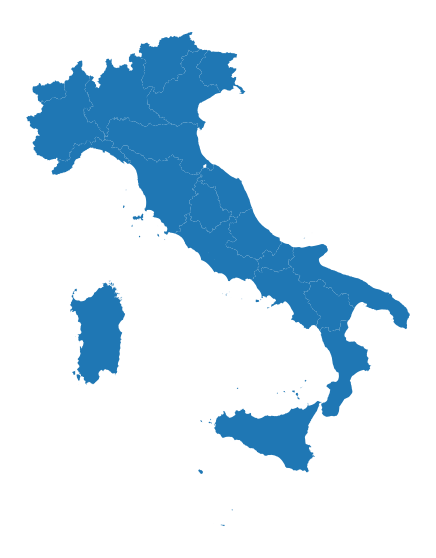

In [52]:
# Store data
regional_data = gpd.read_file(regions)
regional_demo_data = pd.read_csv(regional_demographics)

# Fill column of neighbors 
depi.expand(data=regional_data, level="regional", demo = regional_demo_data)
    
# Visualize GeoDataFrame
regional_data.plot(figsize=(10, 10)).set_axis_off()

### Graph Data Manipulation  

In [53]:
# Build the regional undirected graph
regional_graph = depi.build_graph(data = regional_data,
                                  level = "regional",
                                  graph = nx.Graph())

### Graph Data Visualization 

CONNECTIVITY:
• 20 nodes;
• 31 edges.


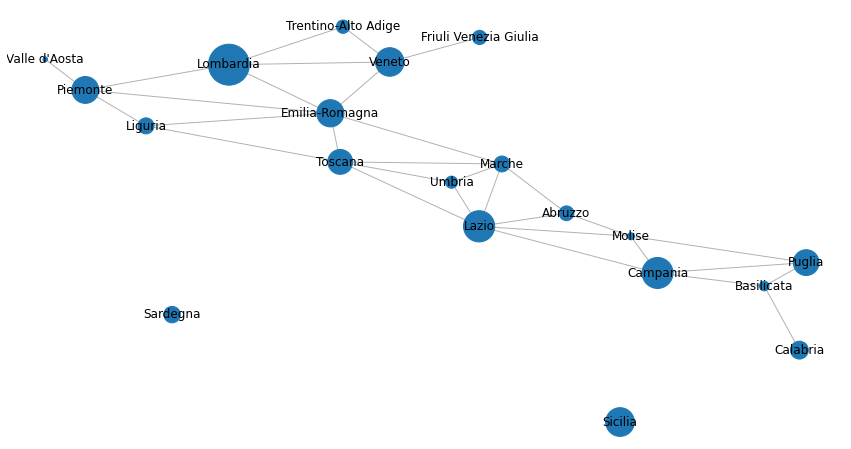

In [54]:
# Showcase connectivity
print("CONNECTIVITY:\n•",regional_graph.number_of_nodes(),"nodes;\n•",regional_graph.number_of_edges(),"edges.")

regional_pop_list = [10000*regional_graph.pop[i] for i in list(regional_graph.nodes)] / sum([regional_graph.pop[i] for i in list(regional_graph.nodes)])

# Visualize graph 
fig=plt.figure(figsize=(15,8))
nx.draw_networkx_nodes(regional_graph, pos=regional_graph.pos,node_size=regional_pop_list)
nx.draw_networkx_edges(regional_graph, pos=regional_graph.pos, alpha=0.3) 
nx.draw_networkx_labels(regional_graph, pos=regional_graph.pos)
plt.axis('off')
plt.show()

## Provincial Level

### Data Manipulation 

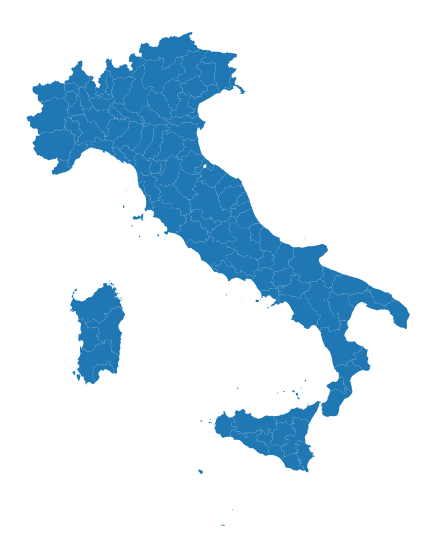

In [55]:
# Store data
provincial_data = gpd.read_file(provinces)
provincial_demo_data = pd.read_csv(provincial_demographics)

# Fill column of neighbors 
depi.expand(data=provincial_data, level="provincial", demo = provincial_demo_data)
    
# Visualize GeoDataFrame
provincial_data.plot(figsize=(10, 10)).set_axis_off()

### Graph Data Manipulation 

In [56]:
# Build the regional undirected graph
provincial_graph = depi.build_graph(data = provincial_data,
                                  level = "provincial",
                                  graph = nx.Graph())

### Graph Data Visualization 

CONNECTIVITY:
• 107 nodes;
• 238 edges.


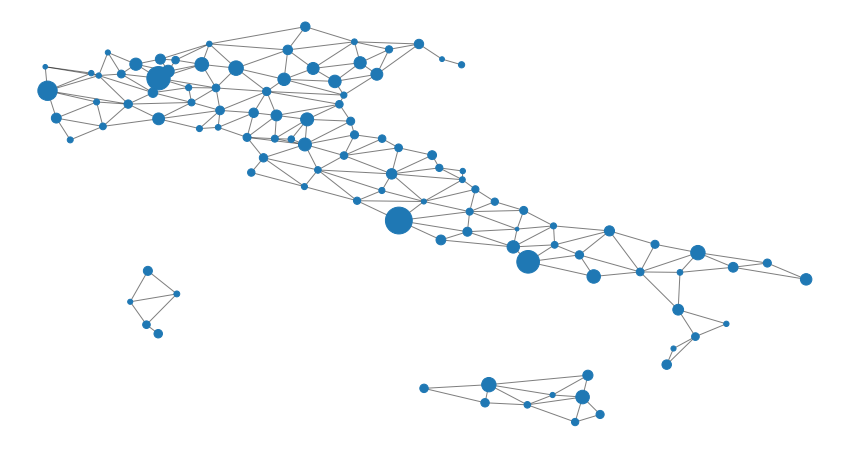

In [30]:
# Showcase connectivity
print("CONNECTIVITY:\n•",provincial_graph.number_of_nodes(),"nodes;\n•",provincial_graph.number_of_edges(),"edges.")

provincial_pop_list = [10000*provincial_graph.pop[i] for i in list(provincial_graph.nodes)] / sum([provincial_graph.pop[i] for i in list(provincial_graph.nodes)])

# Visualize Graph
fig=plt.figure(figsize=(15,8))
nx.draw_networkx_nodes(provincial_graph, pos=provincial_graph.pos,node_size=provincial_pop_list)
nx.draw_networkx_edges(provincial_graph,pos=provincial_graph.pos, alpha = 0.5)
#nx.draw_networkx_labels(H, pos=H.pos)
plt.axis('off')
plt.show()

In [3]:
#municipal_graph = nx.read_graphml("./MunicipalGraph.graphml")
#provincial_graph = nx.read_graphml("./ProvincialGraph.graphml")
#regional_graph = nx.read_graphml("./RegionalGraph.graphml")

In [58]:
#nx.get_node_attributes(municipal_graph, 'position')

{}

In [17]:
#municipalities = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/Shape/Com01012020/Com01012020_WGS84.shp"

In [18]:
#municipal_demographics = "/Users/pietromonticone/github/DigitalEpidemiologyProject/Data/CSV/MunicipalDemographics.csv"

In [19]:
# Store data
municipal_data = gpd.read_file(municipalities)
municipal_demo_data = pd.read_csv(municipal_demographics)

In [20]:
municipal_data

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,SHAPE_LENG,SHAPE_AREA,SHAPE_LEN,geometry
0,1,1,1,201,201,1077,001077,Chiaverano,None,0,18164.369945,1.202212e+07,18164.236621,"POLYGON ((414358.390 5042001.044, 414381.796 5..."
1,1,1,1,201,201,1079,001079,Chiesanuova,None,0,10777.398475,4.118911e+06,10777.318814,"POLYGON ((394621.039 5031581.116, 394716.100 5..."
2,1,1,1,201,201,1089,001089,Coazze,None,0,41591.434852,5.657268e+07,41591.122092,"POLYGON ((364914.897 4993224.894, 364929.991 4..."
3,1,1,1,201,201,1006,001006,Almese,None,0,17058.567837,1.787564e+07,17058.439037,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
4,1,1,1,201,201,1007,001007,Alpette,None,0,9795.635259,5.626076e+06,9795.562269,"POLYGON ((388890.737 5030465.123, 388945.987 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7899,3,12,58,258,258,58091,058091,Roma,None,1,332527.088819,1.287372e+09,332740.844569,"MULTIPOLYGON (((769745.512 4625758.611, 769787..."
7900,5,19,82,282,282,82045,082045,Lercara Friddi,None,0,41752.151492,3.749310e+07,42315.473379,"POLYGON ((911026.790 4190436.780, 911110.915 4..."
7901,5,19,82,282,282,82078,082078,Vicari,None,0,0.000000,8.594625e+07,56126.024420,"POLYGON ((903617.640 4186159.573, 903583.834 4..."
7902,2,4,21,0,21,21076,021076,Salorno sulla strada del vino,Salurn an der WeinstraÃe,0,38330.113460,3.312504e+07,38329.838310,"POLYGON ((676383.291 5127075.411, 676424.729 5..."


In [22]:
municipal_list = list(municipal_data.PRO_COM)
municipal_graph.pos = dict.fromk
eys(municipal_list)    # position 
k = 0
for municipality in municipal_list:
    municipal_graph.pos[municipality] = (municipal_data.centroid[k].x, municipal_data.centroid[k].y)
    k +=1

In [59]:
municipal_graph.pos

{1077: (414253.04131357884, 5039520.916715947),
 1079: (394197.39466499235, 5030810.768623414),
 1089: (360808.8022370988, 4990103.70991152),
 1006: (375721.5010853483, 4997293.646881642),
 1007: (388609.91090080846, 5029096.062429139),
 1039: (426277.5237322859, 5000245.449243062),
 1083: (402942.18611820514, 5020316.321616266),
 1062: (379625.8145873824, 4995884.772471814),
 1082: (413296.3545559609, 5006412.642996574),
 1008: (383325.1010719231, 4995234.835323881),
 1009: (410699.80169581075, 4987582.8037020685),
 1020: (410407.68242733506, 5034542.708517216),
 1043: (395071.5256018486, 5019616.645326285),
 1027: (417819.2540738052, 5035292.711112581),
 1064: (412979.63102844247, 5001608.235468652),
 1066: (399497.6830467697, 5028707.34803755),
 1084: (396879.76739535655, 5032815.033782528),
 1021: (391841.57098469214, 5016587.351093075),
 1023: (411085.5000341657, 5018942.519475417),
 1024: (388919.1653771722, 4985726.816187726),
 1026: (347039.39267756086, 4960813.2321578525),
 10

In [47]:
municipal_position = open("MunicipalPosition.pkl", "wb")
pickle.dump(municipal_graph.pos, municipal_position)
municipal_position.close()

provincial_position = open("ProvincialPosition.pkl", "wb")
pickle.dump(provincial_graph.pos, provincial_position)
municipal_position.close()

regional_position = open("RegionalPosition.pkl", "wb")
pickle.dump(regional_graph.pos, regional_position)
municipal_position.close()

#file = open("MunicipalPosition.pkl", "rb")
#output = pickle.load(open("MunicipalPosition.pkl", "rb"))
#municipal_position = municipal_graph.pos

In [240]:
# Set random seed
#np.random.seed(1)

# Create list colors
#cols = ['steelblue', 'darksalmon', 'mediumseagreen']
cols = ['steelblue', 'darksalmon', 'mediumseagreen']

# Create list of grphs
#municipal_graph, 
graphs = [municipal_graph, 
          provincial_graph, 
          regional_graph]

# Set width
width = 55
# Set height
height = 55

# Create figure
fig, ax = plt.subplots(1, 1, figsize=(width,height), dpi=300, subplot_kw={'projection':'3d'})
for gi, G in enumerate(graphs):
    pos = {}
    lines3d = []
    
    xs = list(list(zip(*list(graphs[0].pos.values())))[0])
    ys = list(list(zip(*list(graphs[0].pos.values())))[1])
    
    xdiff = max(xs)-min(xs)
    ydiff = max(ys)-min(ys)
    
    xmin = min(xs)-xdiff*0.1 * (width/height)
    xmax = max(xs)+xdiff*0.1 * (width/height)
    ymin = min(ys)-ydiff*0.1
    ymax = max(ys)+ydiff*0.1
    
    
    if gi == 0: 
        pos = G.pos
        lines3d = [(list(pos[int(i)])+[gi],list(pos[int(j)])+[gi]) for i,j in G.edges()]
        node_size = 1
    elif gi == 1: 
        pos = G.pos
        lines3d = [(list(pos[i])+[gi],list(pos[j])+[gi]) for i,j in G.edges()]
        node_size = 1000
    elif gi == 2:
        pos = G.pos
        lines3d = [(list(pos[i])+[gi],list(pos[j])+[gi]) for i,j in G.edges()]
        node_size = 7000
    
    # node positions
    xs = list(list(zip(*list(pos.values())))[0])
    ys = list(list(zip(*list(pos.values())))[1])
    zs = [gi]*len(xs)   # set a common z-position of the nodes

    # node colors
    cs = [cols[gi]]*len(xs)
    
    # add intra-layer edges 
    ###lines3d = [(list(pos[str(i)])+[gi],list(pos[str(j)])+[gi]) for str(i),str(j) in G.edges()]
    line_collection = Line3DCollection(lines3d, zorder=gi, color=cols[gi], alpha=0.8)
    ax.add_collection3d(line_collection)
    
    
    #pop = [10000*pop for pop in list(nx.get_node_attributes(G, 'population').values()) / sum(list(nx.get_node_attributes(G, 'population').values()))]

    # now add nodes
    ax.scatter(xs, ys, zs, s=node_size ,c=cs, edgecolors='.3', marker='.', alpha=1, zorder=gi)
    
    # add a plane to designate the layer
    xdiff = max(xs)-min(xs)
    ydiff = max(ys)-min(ys)
    #ymin = min(ys)-ydiff*0.1
    #ymax = max(ys)+ydiff*0.1
    #xmin = min(xs)-xdiff*0.1 * (width/height)
    #xmax = max(xs)+xdiff*0.1 * (width/height)
    #xx, yy = np.meshgrid([xmin, xmax],[ymin, ymax])
    xx, yy = np.meshgrid([xmin, xmax],[ymin, ymax])
    zz = np.zeros(xx.shape)+gi
    ax.plot_surface(xx, yy, zz, color=cols[gi], alpha=0.1, zorder=gi)


# set them all at the same x,y,zlims
#ax.set_ylim(min(ys)-ydiff*0.1,max(ys)+ydiff*0.1)
#ax.set_xlim(min(xs)-xdiff*0.1,max(xs)+xdiff*0.1)
#ax.set_zlim(-0.1, len(graphs) - 1 + 0.1)

ax.set_ylim(min(ys)-ydiff*0.1,max(ys)+ydiff*0.1)
ax.set_xlim(min(xs)-xdiff*0.1,max(xs)+xdiff*0.1)
ax.set_zlim(-0.1, 2.1)

# select viewing angle
ax.view_init(23, -80)

# how much do you want to zoom into the fig
ax.dist=9

ax.set_axis_off()

#plt.savefig('MultiLayerItaly.png',dpi=400,bbox_inches='tight')
plt.show()